# Object Detection on Satellite Imagery using YOLOv8

##  1. Train from scratch on dior and test on dior

In [1]:
!pip install -U -q gdown ultralytics

In [2]:
!pip install scikit-learn

In [3]:
import os
import shutil
import gdown
import random
import numpy as np
import pandas as pd
from tqdm.auto import tqdm
from collections import Counter
from xml.etree import ElementTree
import cv2
import matplotlib.pyplot as plt
from IPython.display import Image, Video
from ultralytics import YOLO

## Downloading Dataset

In [4]:
raw_data_path = 'raw_data'

In [5]:
if os.path.exists(raw_data_path):
    print('[INFO] Raw data directory exists, skiping download.')
else:
    os.makedirs(raw_data_path)
    print('[INFO] Raw data directory is been created.')
    print('[INFO] Downloading data...\n')
    gdown.download('https://drive.google.com/uc?id=1KoQzqR20qvIXDf1qsXCHGxD003IPmXMw', output=os.path.join(raw_data_path, 'Annotations.zip'))
    gdown.download('https://drive.google.com/uc?id=11SXPqcESez9qTn4Z5Q3v35K9hRwO_epr', output=os.path.join(raw_data_path, 'JPEGImages-test.zip'))
    gdown.download('https://drive.google.com/uc?id=1ZHbHDM6hYAEGDC_K5eiW0yF_lzVgpuir', output=os.path.join(raw_data_path, 'JPEGImages-trainval.zip'))
    print('[INFO] Data is been downloaded.')

[INFO] Raw data directory is been created.
[INFO] Downloading data...



Downloading...
From (original): https://drive.google.com/uc?id=1KoQzqR20qvIXDf1qsXCHGxD003IPmXMw
From (redirected): https://drive.google.com/uc?id=1KoQzqR20qvIXDf1qsXCHGxD003IPmXMw&confirm=t&uuid=48ce24ba-7df7-44ef-b16d-6c1e01f888b7
To: /kaggle/working/raw_data/Annotations.zip
100%|██████████| 32.1M/32.1M [00:00<00:00, 51.0MB/s]
Downloading...
From (original): https://drive.google.com/uc?id=11SXPqcESez9qTn4Z5Q3v35K9hRwO_epr
From (redirected): https://drive.google.com/uc?id=11SXPqcESez9qTn4Z5Q3v35K9hRwO_epr&confirm=t&uuid=198441a0-e338-4c31-82bc-c8eb73fe2a58
To: /kaggle/working/raw_data/JPEGImages-test.zip
100%|██████████| 3.52G/3.52G [00:52<00:00, 66.6MB/s]
Downloading...
From (original): https://drive.google.com/uc?id=1ZHbHDM6hYAEGDC_K5eiW0yF_lzVgpuir
From (redirected): https://drive.google.com/uc?id=1ZHbHDM6hYAEGDC_K5eiW0yF_lzVgpuir&confirm=t&uuid=24ac568b-eb8c-43e2-88cb-ef56e7eb6d59
To: /kaggle/working/raw_data/JPEGImages-trainval.zip
100%|██████████| 3.88G/3.88G [01:04<00:00, 60.6M

[INFO] Data is been downloaded.


In [6]:
dior_data_path = 'dior_data'

In [7]:
# Extracting the zip data files
if os.path.exists(dior_data_path):
    print('[INFO] DIOR data directory exists, skiping extraction.')
else:
    os.makedirs(dior_data_path)
    for i in os.listdir(raw_data_path):
        filename = os.path.join(raw_data_path, i) 
        shutil.unpack_archive(filename=filename, extract_dir=dior_data_path)
        print(f'[INFO] File "{filename}" is been extracted to "{dior_data_path}".')

[INFO] File "raw_data/JPEGImages-test.zip" is been extracted to "dior_data".
[INFO] File "raw_data/Annotations.zip" is been extracted to "dior_data".
[INFO] File "raw_data/JPEGImages-trainval.zip" is been extracted to "dior_data".


## Data Preprocessing, EDA and Visualization

In [8]:
# Path for all the data
annot_data_path = 'dior_data/Annotations/Horizontal Bounding Boxes'
trainval_data_path = 'dior_data/JPEGImages-trainval'
test_data_path = 'dior_data/JPEGImages-test'

In [9]:
# Creating a list of annotation files
annot_file_list = sorted([os.path.join(annot_data_path, i) for i in os.listdir(annot_data_path) if '.xml' in i])
annot_file_list[:5], annot_file_list[-5:], len(annot_file_list)

(['dior_data/Annotations/Horizontal Bounding Boxes/00001.xml',
  'dior_data/Annotations/Horizontal Bounding Boxes/00002.xml',
  'dior_data/Annotations/Horizontal Bounding Boxes/00003.xml',
  'dior_data/Annotations/Horizontal Bounding Boxes/00004.xml',
  'dior_data/Annotations/Horizontal Bounding Boxes/00005.xml'],
 ['dior_data/Annotations/Horizontal Bounding Boxes/23459.xml',
  'dior_data/Annotations/Horizontal Bounding Boxes/23460.xml',
  'dior_data/Annotations/Horizontal Bounding Boxes/23461.xml',
  'dior_data/Annotations/Horizontal Bounding Boxes/23462.xml',
  'dior_data/Annotations/Horizontal Bounding Boxes/23463.xml'],
 23463)

In [10]:
# Creating a list of training and validation images
trainval_file_list = sorted([os.path.join(trainval_data_path, i) for i in os.listdir(trainval_data_path) if '.jpg' in i])
trainval_file_list[:5], trainval_file_list[-5:], len(trainval_file_list)

(['dior_data/JPEGImages-trainval/00001.jpg',
  'dior_data/JPEGImages-trainval/00002.jpg',
  'dior_data/JPEGImages-trainval/00003.jpg',
  'dior_data/JPEGImages-trainval/00004.jpg',
  'dior_data/JPEGImages-trainval/00005.jpg'],
 ['dior_data/JPEGImages-trainval/11721.jpg',
  'dior_data/JPEGImages-trainval/11722.jpg',
  'dior_data/JPEGImages-trainval/11723.jpg',
  'dior_data/JPEGImages-trainval/11724.jpg',
  'dior_data/JPEGImages-trainval/11725.jpg'],
 11725)

In [11]:
# Creating a list of testing images
test_file_list = sorted([os.path.join(test_data_path, i) for i in os.listdir(test_data_path) if '.jpg' in i])
test_file_list[:5], test_file_list[-5:], len(test_file_list)

(['dior_data/JPEGImages-test/11726.jpg',
  'dior_data/JPEGImages-test/11727.jpg',
  'dior_data/JPEGImages-test/11728.jpg',
  'dior_data/JPEGImages-test/11729.jpg',
  'dior_data/JPEGImages-test/11730.jpg'],
 ['dior_data/JPEGImages-test/23459.jpg',
  'dior_data/JPEGImages-test/23460.jpg',
  'dior_data/JPEGImages-test/23461.jpg',
  'dior_data/JPEGImages-test/23462.jpg',
  'dior_data/JPEGImages-test/23463.jpg'],
 11738)

In [12]:
# Combining all the images path in one list
image_data_file_list = np.concatenate((trainval_file_list, test_file_list))
image_data_file_list[:5], image_data_file_list[-5:], len(image_data_file_list)

(array(['dior_data/JPEGImages-trainval/00001.jpg', 'dior_data/JPEGImages-trainval/00002.jpg', 'dior_data/JPEGImages-trainval/00003.jpg', 'dior_data/JPEGImages-trainval/00004.jpg', 'dior_data/JPEGImages-trainval/00005.jpg'], dtype='<U39'),
 array(['dior_data/JPEGImages-test/23459.jpg', 'dior_data/JPEGImages-test/23460.jpg', 'dior_data/JPEGImages-test/23461.jpg', 'dior_data/JPEGImages-test/23462.jpg', 'dior_data/JPEGImages-test/23463.jpg'], dtype='<U39'),
 23463)

### Exploratory Data Analysis

In [13]:
# Extracting data from annotation files
meta_list = [] # To store general info for every image
object_list_train = [] # To store object classes info of train dataset
object_list_test = [] # To store object classes info of test dataset

for file in tqdm(annot_file_list):
    meta_dict = {}
    root = ElementTree.parse(file).getroot()
    
    # Filename - extracted
    for path in image_data_file_list:
        if root.find('filename').text in path:
            meta_dict['filename'] = path
            meta_dict['split_type'] = path.split('/')[1]
    
    # Width - extracted
    meta_dict['width'] = int(root.find('size').find('width').text)
    
    # Height - extracted
    meta_dict['height'] = int(root.find('size').find('height').text)
    
    # Objects - extracted and combined into a single string
    meta_dict['objects'] = ', '.join(np.unique([obj.find('name').text for obj in root.findall('object')]))
    meta_list.append(meta_dict)
    
    # Collecting all the object classes instance and counting total appearance
    for obj in root.findall('object'):
        if meta_dict['split_type'] == 'JPEGImages-trainval':
            object_list_train.append(obj.find('name').text)
        elif meta_dict['split_type'] == 'JPEGImages-test':
            object_list_test.append(obj.find('name').text)
    
# Counting the instance for every object class
object_instance_list_train = Counter(sorted(object_list_train))
object_instance_list_test = Counter(sorted(object_list_test))
    
# Collecting Class list and indexing it also in a sequence
class_dict = {k: v for v, k in enumerate(sorted(np.unique(object_list_train)))}

meta_list[:5], object_instance_list_train, object_instance_list_test, class_dict

  0%|          | 0/23463 [00:00<?, ?it/s]

([{'filename': 'dior_data/JPEGImages-trainval/00001.jpg',
   'split_type': 'JPEGImages-trainval',
   'width': 800,
   'height': 800,
   'objects': 'golffield'},
  {'filename': 'dior_data/JPEGImages-trainval/00002.jpg',
   'split_type': 'JPEGImages-trainval',
   'width': 800,
   'height': 800,
   'objects': 'Expressway-toll-station, vehicle'},
  {'filename': 'dior_data/JPEGImages-trainval/00003.jpg',
   'split_type': 'JPEGImages-trainval',
   'width': 800,
   'height': 800,
   'objects': 'trainstation'},
  {'filename': 'dior_data/JPEGImages-trainval/00004.jpg',
   'split_type': 'JPEGImages-trainval',
   'width': 800,
   'height': 800,
   'objects': 'chimney'},
  {'filename': 'dior_data/JPEGImages-trainval/00005.jpg',
   'split_type': 'JPEGImages-trainval',
   'width': 800,
   'height': 800,
   'objects': 'storagetank, vehicle'}],
 Counter({'ship': 27351,
          'vehicle': 13725,
          'tenniscourt': 4898,
          'storagetank': 3042,
          'baseballfield': 2384,
          '

In [14]:
# Creating a dataframe from the extracted data
meta_df = pd.DataFrame(meta_list)
meta_df

,filename,split_type,width,height,objects
0,dior_data/JPEGImages-trainval/00001.jpg,JPEGImages-trainval,800,800,golffield
1,dior_data/JPEGImages-trainval/00002.jpg,JPEGImages-trainval,800,800,"Expressway-toll-station, vehicle"
2,dior_data/JPEGImages-trainval/00003.jpg,JPEGImages-trainval,800,800,trainstation
3,dior_data/JPEGImages-trainval/00004.jpg,JPEGImages-trainval,800,800,chimney
4,dior_data/JPEGImages-trainval/00005.jpg,JPEGImages-trainval,800,800,"storagetank, vehicle"
...,...,...,...,...,...
23458,dior_data/JPEGImages-test/23459.jpg,JPEGImages-test,800,800,vehicle
23459,dior_data/JPEGImages-test/23460.jpg,JPEGImages-test,800,800,"groundtrackfield, tenniscourt, vehicle"
23460,dior_data/JPEGImages-test/23461.jpg,JPEGImages-test,800,800,"overpass, vehicle"
23461,dior_data/JPEGImages-test/23462.jpg,JPEGImages-test,800,800,"overpass, vehicle"


In [15]:
print(f'Size of the images width: {meta_df.width.unique()[0]} and height: {meta_df.height.unique()[0]}')
print(f'Total number of classes with all possible combination: {len(meta_df.objects.unique())}')
print(f'Total length of the training/validation dataset: {len(meta_df[meta_df["split_type"] == "JPEGImages-trainval"])} and testing dataset: {len(meta_df[meta_df["split_type"] == "JPEGImages-test"])}')

Size of the images width: 800 and height: 800
Total number of classes with all possible combination: 526
Total length of the training/validation dataset: 11725 and testing dataset: 11738


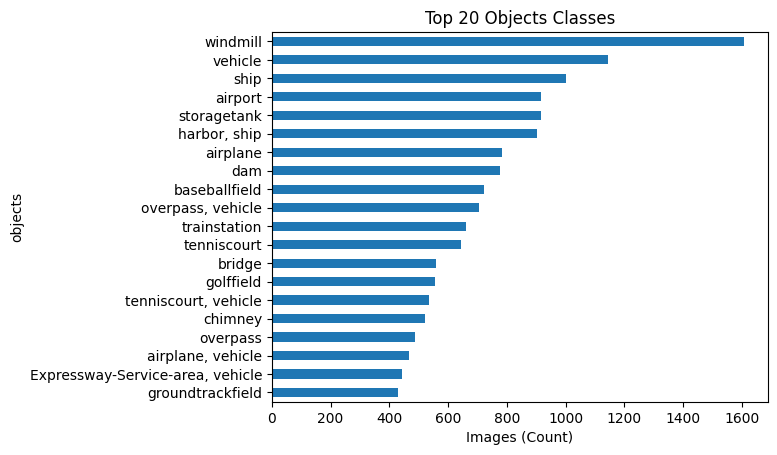

In [16]:
# Top 20 classes in the dataset
meta_df.objects.value_counts()[:20].plot(kind='barh').invert_yaxis()
plt.xlabel('Images (Count)')
plt.title('Top 20 Objects Classes');

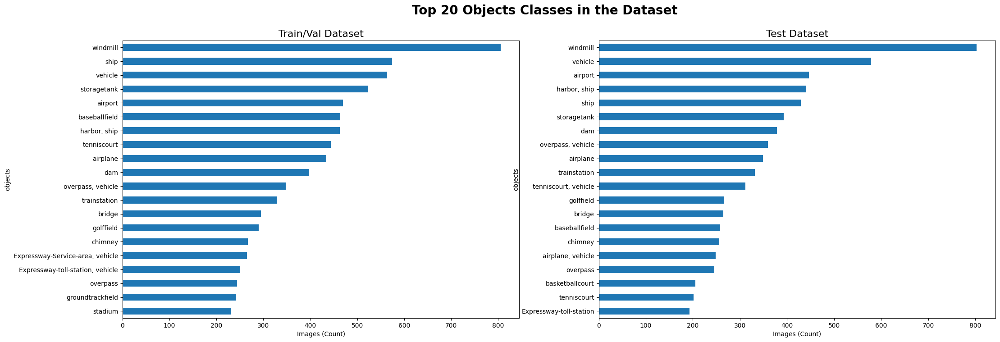

In [17]:
plt.figure(figsize=(25, 8))
plt.subplot(1, 2, 1)
meta_df[meta_df["split_type"] == "JPEGImages-trainval"].objects.value_counts()[:20].plot(kind='barh').invert_yaxis()
plt.xlabel('Images (Count)')
plt.title('Train/Val Dataset', fontsize=16)
plt.subplot(1, 2, 2)
meta_df[meta_df["split_type"] == "JPEGImages-test"].objects.value_counts()[:20].plot(kind='barh').invert_yaxis()
plt.xlabel('Images (Count)')
plt.title('Test Dataset', fontsize=16)
plt.suptitle('Top 20 Objects Classes in the Dataset', fontsize=20, fontweight='bold');

### Converting Annotation to YOLO Format

In [18]:
# Creating a function for extracting data
def extract_data_from_xml(xml_file: str):
    """
    A function to extract data like filename, size, classes and bboxes from xml file.
    
    Parameters: xml_file: str, A string containing the path to the file.
    
    Returns: data_dict: dict, A dict containing all the extracted data.
    """
    root = ElementTree.parse(xml_file).getroot()
    
    # Creating dict and list to store data
    data_dict = {}
    data_dict['bboxes'] = []
    
    # Reading the xml file
    for element in root:
        # Getting the filename
        if element.tag == 'filename':
            data_dict['filename'] = element.text
        
        # Getting the image size
        elif element.tag == 'size':
            image_size = []
            for size_element in element:
                image_size.append(int(size_element.text))
            data_dict['image_size'] = image_size
        
        # Getting the bounding box
        elif element.tag == 'object':
            bbox = {}
            for obj_element in element:
                # Object or Class name
                if obj_element.tag == 'name':
                    bbox['class'] = obj_element.text
                # Object bounding box 
                elif obj_element.tag == 'bndbox':
                    for bbox_element in obj_element:
                        bbox[bbox_element.tag] = int(bbox_element.text)
            data_dict['bboxes'].append(bbox)
    return data_dict

In [19]:
example = extract_data_from_xml(annot_file_list[1])
example

{'bboxes': [{'class': 'Expressway-toll-station',
   'xmin': 231,
   'ymin': 221,
   'xmax': 303,
   'ymax': 304},
  {'class': 'vehicle', 'xmin': 49, 'ymin': 231, 'xmax': 67, 'ymax': 242},
  {'class': 'vehicle', 'xmin': 54, 'ymin': 252, 'xmax': 72, 'ymax': 262},
  {'class': 'vehicle', 'xmin': 297, 'ymin': 227, 'xmax': 316, 'ymax': 239}],
 'filename': '00002.jpg',
 'image_size': [800, 800, 3]}

In [20]:
# Creating a function to create a YOLO format annotation
def convert_dict_to_yolo(data_dict: dict):
    """
    A function to convert the extracted data dict into a text file as per the YOLO format.
    The final text file is saved in the directory "dior_data/yolo_annotations/data_dict['filename'].txt".
    
    Parameters: data_dict: dict, A dict containing the data.
    """
    data = []
    
    # Reading the bounding box data
    for bbox in data_dict['bboxes']:
        try:
            class_id = class_dict[bbox['class']]
        except KeyError:
            print(f'Invalid Class. Object class: "{bbox["class"]}" not present in the class list.')
            
        # Transforming the bbox in Yolo format [X, Y, W, H]
        img_w, img_h, _ = data_dict['image_size'] # Normalizing the bbox using image size
        
        x_center = ((bbox['xmin'] + bbox['xmax']) / 2) / img_w
        y_center = ((bbox['ymin'] + bbox['ymax']) / 2) / img_h
        width = (bbox['xmax'] - bbox['xmin']) / img_w 
        height = (bbox['ymax'] - bbox['ymin']) / img_h
        
        # Writing the new data to the data list in Yolo format
        data.append(f'{class_id} {x_center:.3f} {y_center:.3f} {width:.3f} {height:.3f}')
        
    # File name for saving the text file(same as xml and jpg file name)
    yolo_annot_dir = os.path.join('dior_data', 'yolo_annotations')
    if not os.path.exists(yolo_annot_dir):
        os.makedirs(yolo_annot_dir)
    save_file_name = os.path.join(yolo_annot_dir, data_dict['filename'].replace('jpg', 'txt'))
    
    # Saving the yolo annotation in a text file
    f = open(save_file_name, 'w+')
    f.write('\n'.join(data))
    f.close()

In [21]:
# Converting all the xml files into Yolo format text files
print('[INFO] Annotation extraction and creation into Yolo has started.')
for annot_file in tqdm(annot_file_list):
    data_dict = extract_data_from_xml(annot_file)
    convert_dict_to_yolo(data_dict)
print('[INFO] All the annotation are converted into Yolo format.')

[INFO] Annotation extraction and creation into Yolo has started.


  0%|          | 0/23463 [00:00<?, ?it/s]

[INFO] All the annotation are converted into Yolo format.


In [22]:
yolo_annot_path = 'dior_data/yolo_annotations'
yolo_annot_file_list = sorted([os.path.join(yolo_annot_path, i) for i in os.listdir(yolo_annot_path) if '.txt' in i])
yolo_annot_file_list[:5], yolo_annot_file_list[-5:], len(yolo_annot_file_list)

(['dior_data/yolo_annotations/00001.txt',
  'dior_data/yolo_annotations/00002.txt',
  'dior_data/yolo_annotations/00003.txt',
  'dior_data/yolo_annotations/00004.txt',
  'dior_data/yolo_annotations/00005.txt'],
 ['dior_data/yolo_annotations/23459.txt',
  'dior_data/yolo_annotations/23460.txt',
  'dior_data/yolo_annotations/23461.txt',
  'dior_data/yolo_annotations/23462.txt',
  'dior_data/yolo_annotations/23463.txt'],
 23463)

In [23]:
class_dict_idx = dict(zip(class_dict.values(), class_dict.keys()))
class_dict_idx

{0: 'Expressway-Service-area',
 1: 'Expressway-toll-station',
 2: 'airplane',
 3: 'airport',
 4: 'baseballfield',
 5: 'basketballcourt',
 6: 'bridge',
 7: 'chimney',
 8: 'dam',
 9: 'golffield',
 10: 'groundtrackfield',
 11: 'harbor',
 12: 'overpass',
 13: 'ship',
 14: 'stadium',
 15: 'storagetank',
 16: 'tenniscourt',
 17: 'trainstation',
 18: 'vehicle',
 19: 'windmill'}

### Stratified split

In [24]:
import os
import shutil
import numpy as np
import gdown
from tqdm import tqdm
from sklearn.model_selection import train_test_split, StratifiedShuffleSplit
import xml.etree.ElementTree as ET

In [25]:
# Function to parse XML and get class labels
def get_class_from_annotation(xml_file):
    tree = ET.parse(xml_file)
    root = tree.getroot()
    return [obj.find('name').text for obj in root.findall('object')]

In [26]:
trainval_labels = []
for annot_file in trainval_file_list:
    annot_path = os.path.join(annot_data_path, os.path.basename(annot_file).replace('.jpg', '.xml'))
    if os.path.exists(annot_path):
        trainval_labels.append(get_class_from_annotation(annot_path)[0])
    else:
        trainval_labels.append('unknown')

In [27]:
test_labels = []
for annot_file in test_file_list:
    annot_path = os.path.join(annot_data_path, os.path.basename(annot_file).replace('.jpg', '.xml'))
    if os.path.exists(annot_path):
        test_labels.append(get_class_from_annotation(annot_path)[0])
    else:
        test_labels.append('unknown')

In [28]:
# Stratified splitting of the dataset
sss_test = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
trainval_indices, test_indices = next(sss_test.split(trainval_file_list, trainval_labels))

trainval_file_list = np.array(trainval_file_list)
test_file_list = np.array(test_file_list)
train_files, test_files = trainval_file_list[trainval_indices], test_file_list[test_indices]
train_labels, test_labels = np.array(trainval_labels)[trainval_indices], np.array(test_labels)[test_indices]

sss_val = StratifiedShuffleSplit(n_splits=1, test_size=0.25, random_state=42)  # 0.25 * 0.8 = 0.2 of total dataset
train_indices, val_indices = next(sss_val.split(train_files, train_labels))

train_files, val_files = train_files[train_indices], train_files[val_indices]
train_labels, val_labels = train_labels[train_indices], train_labels[val_indices]

In [29]:
trainval_file_list[:5], trainval_file_list[-5:], len(trainval_file_list)

(array(['dior_data/JPEGImages-trainval/00001.jpg', 'dior_data/JPEGImages-trainval/00002.jpg', 'dior_data/JPEGImages-trainval/00003.jpg', 'dior_data/JPEGImages-trainval/00004.jpg', 'dior_data/JPEGImages-trainval/00005.jpg'], dtype='<U39'),
 array(['dior_data/JPEGImages-trainval/11721.jpg', 'dior_data/JPEGImages-trainval/11722.jpg', 'dior_data/JPEGImages-trainval/11723.jpg', 'dior_data/JPEGImages-trainval/11724.jpg', 'dior_data/JPEGImages-trainval/11725.jpg'], dtype='<U39'),
 11725)

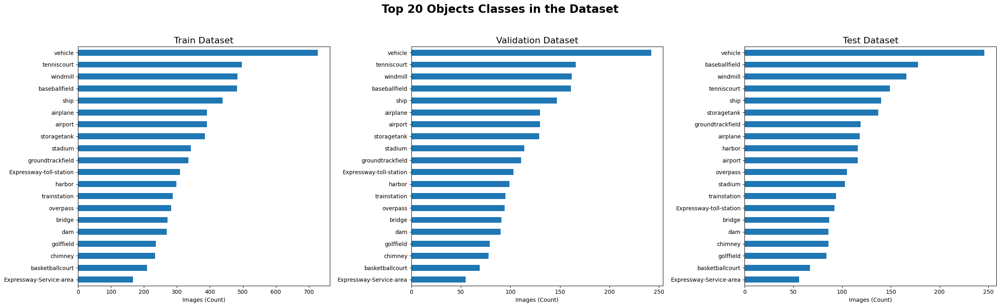

In [30]:
import matplotlib.pyplot as plt
import pandas as pd
from collections import Counter

# Assuming train_labels, val_labels, and test_labels contain the class labels for each set

# Count the occurrences of each class in train, validation, and test sets
train_counts = Counter(train_labels)
val_counts = Counter(val_labels)
test_counts = Counter(test_labels)

trainval_counts = train_counts + val_counts

# Convert the counts to DataFrames for easier plotting
train_df = pd.DataFrame.from_dict(train_counts, orient='index', columns=['count'])
val_df = pd.DataFrame.from_dict(val_counts, orient='index', columns=['count'])
test_df = pd.DataFrame.from_dict(test_counts, orient='index', columns=['count'])
trainval_df = pd.DataFrame.from_dict(trainval_counts, orient='index', columns=['count'])

# Sort the DataFrames by count for better visualization
train_df = train_df.sort_values(by='count', ascending=False)
val_df = val_df.sort_values(by='count', ascending=False)
test_df = test_df.sort_values(by='count', ascending=False)
trainval_df = trainval_df.sort_values(by='count', ascending=False)

# Plot the top 20 classes in each dataset
plt.figure(figsize=(25, 8))

plt.subplot(1, 3, 1)
train_df[:20].plot(kind='barh', legend=False, ax=plt.gca()).invert_yaxis()
plt.xlabel('Images (Count)')
plt.title('Train Dataset', fontsize=16)

plt.subplot(1, 3, 2)
val_df[:20].plot(kind='barh', legend=False, ax=plt.gca()).invert_yaxis()
plt.xlabel('Images (Count)')
plt.title('Validation Dataset', fontsize=16)

plt.subplot(1, 3, 3)
test_df[:20].plot(kind='barh', legend=False, ax=plt.gca()).invert_yaxis()
plt.xlabel('Images (Count)')
plt.title('Test Dataset', fontsize=16)

plt.suptitle('Top 20 Objects Classes in the Dataset', fontsize=20, fontweight='bold')
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


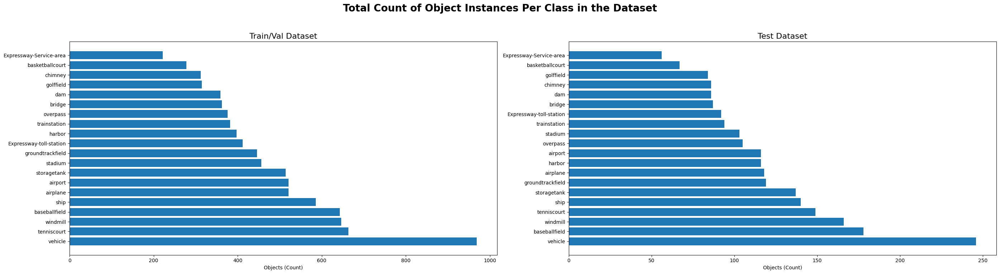

In [31]:
plt.figure(figsize=(28, 8))

plt.subplot(1, 2, 1)
plt.barh(list(trainval_df.index), list(trainval_df['count']))
plt.xlabel('Objects (Count)')
plt.title('Train/Val Dataset', fontsize=16)

plt.subplot(1, 2, 2)
plt.barh(list(test_df.index), list(test_df['count']))
plt.xlabel('Objects (Count)')
plt.title('Test Dataset', fontsize=16)

plt.suptitle('Total Count of Object Instances Per Class in the Dataset', fontsize=20, fontweight='bold')
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

## Training the Yolo Model

In [32]:
# Creating images and labels directory into the data directory
root_dir = 'datasets'
image_dir = 'datasets/images'
label_dir = 'datasets/labels'
img_train_dir = 'datasets/images/train'
img_val_dir = 'datasets/images/val'
label_train_dir = 'datasets/labels/train'
label_val_dir = 'datasets/labels/val'

# Function to move files
def move_files(file_list, target_dir):
    if not os.path.exists(target_dir):
        os.makedirs(target_dir)
    for filepath in tqdm(file_list):
        if os.path.isfile(filepath):
            shutil.move(filepath, target_dir)

# Moving the training images
move_files(train_files, img_train_dir)

# Moving the validation images
move_files(val_files, img_val_dir)


# Function to move corresponding labels
def move_labels(file_list, target_dir):
    if not os.path.exists(target_dir):
        os.makedirs(target_dir)
    for filepath in tqdm(file_list):
        file_path = os.path.join('dior_data/yolo_annotations', filepath.replace('jpg', 'txt').split('/')[-1])
        if os.path.isfile(file_path):
            shutil.move(file_path, target_dir)

# Moving the training labels
move_labels(train_files, label_train_dir)

# Moving the validation labels
move_labels(val_files, label_val_dir)


100%|██████████| 2345/2345 [00:00<00:00, 18561.60it/s]


In [33]:
# Loading the model
model = YOLO('yolov8n.yaml') # Builds the model from scratch

# Loading a pretrained model (Not using this for my dataset)
# model = YOLO('yolov8n.pt')

Creating a config.yaml file for feeding the details to yolo model

In [34]:
%%writefile config.yaml
# Path to my dataset
path: 
train: 'images/train'
val: 'images/val'

# Classes as per mentioned in the annotation
names:
  0: Expressway-Service-area
  1: Expressway-toll-station
  2: airplane
  3: airport
  4: baseballfield
  5: basketballcourt
  6: bridge
  7: chimney
  8: dam
  9: golffield
  10: groundtrackfield
  11: harbor
  12: overpass
  13: ship
  14: stadium
  15: storagetank
  16: tenniscourt
  17: trainstation
  18: vehicle
  19: windmill 

Writing config.yaml


In [36]:
results = model.train(data='config.yaml', imgsz=800, seed = 42, epochs=100, batch=16, name='yolov8n_epochs100_batch16')

New https://pypi.org/project/ultralytics/8.2.38 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.2.37 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.yaml, data=config.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=800, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=yolov8n_epochs100_batch162, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=42, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, sav

train: Scanning /kaggle/working/datasets/labels/train.cache... 7035 images, 0 backgrounds, 0 corrupt: 100%|██████████| 7035/7035 [00:00<?, ?it/s]

train: WARNING ⚠️ /kaggle/working/datasets/images/train/00594.jpg: 1 duplicate labels removed
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /kaggle/working/datasets/labels/val.cache... 2345 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2345/2345 [00:00<?, ?it/s]


Plotting labels to runs/detect/yolov8n_epochs100_batch162/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 800 train, 800 val
Using 2 dataloader workers
Logging results to runs/detect/yolov8n_epochs100_batch162
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      12.3G      3.503      5.377      4.177        107        800: 100%|██████████| 440/440 [02:17<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.13it/s]


                   all       2345      12908      0.713     0.0148    0.00378   0.000947

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      10.1G       2.93      4.304      3.268        152        800: 100%|██████████| 440/440 [02:14<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:24<00:00,  2.98it/s]


                   all       2345      12908      0.747     0.0593     0.0608     0.0276

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      9.89G      2.313      3.376      2.477         80        800: 100%|██████████| 440/440 [02:13<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.12it/s]


                   all       2345      12908      0.643      0.128      0.144     0.0771

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      12.2G      1.969      2.696      2.041         65        800: 100%|██████████| 440/440 [02:13<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.11it/s]


                   all       2345      12908      0.376      0.193      0.183        0.1

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      14.4G      1.755      2.252      1.821         47        800: 100%|██████████| 440/440 [02:13<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.15it/s]


                   all       2345      12908      0.575      0.307      0.319      0.191

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      8.39G      1.633      1.976      1.705        110        800: 100%|██████████| 440/440 [02:13<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.14it/s]


                   all       2345      12908      0.439      0.338      0.336      0.205

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      11.1G      1.581      1.812      1.629        191        800: 100%|██████████| 440/440 [02:13<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.17it/s]


                   all       2345      12908      0.519       0.41      0.416      0.254

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100        13G      1.528      1.713      1.573        239        800: 100%|██████████| 440/440 [02:14<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.18it/s]


                   all       2345      12908      0.557      0.406      0.428      0.263

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      9.74G      1.483      1.612      1.534         50        800: 100%|██████████| 440/440 [02:12<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.20it/s]


                   all       2345      12908      0.509      0.468       0.46      0.292

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      13.5G      1.464      1.536      1.496        303        800: 100%|██████████| 440/440 [02:14<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.18it/s]


                   all       2345      12908      0.562      0.495      0.496      0.313

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      11.2G      1.433      1.485      1.491        125        800: 100%|██████████| 440/440 [02:13<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.20it/s]


                   all       2345      12908      0.626      0.501      0.523      0.334

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      10.6G      1.412      1.444      1.461         44        800: 100%|██████████| 440/440 [02:11<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.15it/s]


                   all       2345      12908      0.555      0.509       0.52      0.335

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      9.13G      1.392      1.392      1.445         77        800: 100%|██████████| 440/440 [02:13<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.17it/s]


                   all       2345      12908      0.603      0.534      0.558      0.358

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      9.75G      1.364      1.334      1.419        149        800: 100%|██████████| 440/440 [02:11<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.16it/s]


                   all       2345      12908      0.691      0.552      0.584      0.369

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      10.9G      1.354      1.313      1.411         51        800: 100%|██████████| 440/440 [02:12<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.19it/s]


                   all       2345      12908      0.659      0.567      0.602      0.392

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      10.6G      1.339      1.275      1.397         81        800: 100%|██████████| 440/440 [02:14<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.14it/s]


                   all       2345      12908      0.683      0.575      0.622      0.402

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      11.7G      1.312      1.224      1.369        100        800: 100%|██████████| 440/440 [02:11<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.17it/s]


                   all       2345      12908      0.665      0.582      0.618        0.4

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      8.72G      1.305      1.209      1.361        155        800: 100%|██████████| 440/440 [02:12<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.17it/s]


                   all       2345      12908      0.673       0.59      0.627      0.409

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      11.6G      1.281      1.175      1.345         54        800: 100%|██████████| 440/440 [02:11<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.19it/s]


                   all       2345      12908      0.733      0.611      0.649      0.432

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      9.38G      1.269      1.176      1.342         37        800: 100%|██████████| 440/440 [02:10<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.18it/s]


                   all       2345      12908      0.699      0.617      0.655      0.433

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      9.55G      1.259      1.158      1.336        144        800: 100%|██████████| 440/440 [02:11<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:22<00:00,  3.22it/s]


                   all       2345      12908      0.725      0.625      0.672      0.444

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      11.9G      1.268      1.144      1.332        141        800: 100%|██████████| 440/440 [02:11<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.12it/s]


                   all       2345      12908      0.743      0.619      0.676      0.449

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      11.3G      1.246      1.127       1.32        516        800: 100%|██████████| 440/440 [02:12<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.18it/s]


                   all       2345      12908      0.713      0.631      0.665      0.443

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100       8.2G      1.225      1.101      1.316         78        800: 100%|██████████| 440/440 [02:12<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.19it/s]


                   all       2345      12908      0.782      0.644      0.687      0.464

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      12.8G      1.219      1.075      1.294         56        800: 100%|██████████| 440/440 [02:11<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.19it/s]


                   all       2345      12908      0.756      0.641      0.693      0.462

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      8.86G      1.222      1.087       1.31        149        800: 100%|██████████| 440/440 [02:11<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.17it/s]


                   all       2345      12908      0.741      0.633      0.691      0.467

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100        11G      1.203      1.059       1.29         91        800: 100%|██████████| 440/440 [02:12<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.15it/s]


                   all       2345      12908      0.749      0.657      0.706      0.476

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      12.2G      1.221      1.055      1.287        118        800: 100%|██████████| 440/440 [02:12<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.17it/s]


                   all       2345      12908      0.745      0.668      0.713      0.481

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      8.64G       1.19      1.022      1.275         45        800: 100%|██████████| 440/440 [02:12<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.16it/s]


                   all       2345      12908      0.772      0.677      0.723      0.492

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      10.2G      1.188      1.023      1.273         43        800: 100%|██████████| 440/440 [02:12<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.16it/s]


                   all       2345      12908      0.769      0.652      0.714      0.488

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      8.95G      1.179      1.003      1.262         52        800: 100%|██████████| 440/440 [02:12<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.17it/s]


                   all       2345      12908      0.793      0.661      0.722      0.496

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      10.4G      1.177     0.9971      1.269        137        800: 100%|██████████| 440/440 [02:13<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.15it/s]


                   all       2345      12908        0.8       0.67      0.728      0.501

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      12.4G      1.179     0.9999      1.267        208        800: 100%|██████████| 440/440 [02:14<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.17it/s]


                   all       2345      12908      0.762      0.684      0.724      0.499

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      12.1G      1.173     0.9757      1.249         54        800: 100%|██████████| 440/440 [02:12<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:22<00:00,  3.24it/s]


                   all       2345      12908        0.8       0.68      0.743      0.508

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100        13G      1.168     0.9824      1.253        199        800: 100%|██████████| 440/440 [02:11<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.16it/s]


                   all       2345      12908      0.785      0.686      0.737      0.506

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      10.9G      1.159      0.962      1.247         46        800: 100%|██████████| 440/440 [02:13<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.19it/s]


                   all       2345      12908      0.803      0.699      0.752      0.522

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      9.73G       1.15     0.9439      1.238        120        800: 100%|██████████| 440/440 [02:12<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:22<00:00,  3.24it/s]


                   all       2345      12908      0.792      0.699      0.743      0.515

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      9.24G      1.137     0.9374      1.234        226        800: 100%|██████████| 440/440 [02:12<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.15it/s]


                   all       2345      12908      0.806      0.692      0.753      0.527

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      11.3G      1.139     0.9277      1.228        391        800: 100%|██████████| 440/440 [02:12<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.19it/s]


                   all       2345      12908      0.825      0.694      0.757      0.527

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      11.1G      1.134     0.9369      1.236        143        800: 100%|██████████| 440/440 [02:11<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.17it/s]


                   all       2345      12908      0.817      0.701      0.758       0.53

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      10.2G      1.133     0.9235      1.229         48        800: 100%|██████████| 440/440 [02:11<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.17it/s]


                   all       2345      12908      0.822      0.703      0.767      0.534

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      12.7G      1.127     0.9175      1.223         77        800: 100%|██████████| 440/440 [02:12<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.18it/s]


                   all       2345      12908      0.833      0.703      0.771      0.538

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      10.3G      1.116     0.9063      1.214         59        800: 100%|██████████| 440/440 [02:11<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.17it/s]


                   all       2345      12908      0.813       0.71      0.767      0.542

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      9.62G      1.118      0.904       1.22        104        800: 100%|██████████| 440/440 [02:12<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.16it/s]


                   all       2345      12908      0.814      0.718      0.775      0.545

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      9.68G       1.11     0.8932      1.208         53        800: 100%|██████████| 440/440 [02:11<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.15it/s]


                   all       2345      12908      0.842      0.702      0.771      0.544

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      9.19G      1.104     0.8905      1.208        157        800: 100%|██████████| 440/440 [02:12<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.18it/s]


                   all       2345      12908      0.822      0.726      0.779      0.551

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      9.96G      1.089     0.8758      1.199        147        800: 100%|██████████| 440/440 [02:11<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.19it/s]


                   all       2345      12908      0.821      0.736       0.79      0.556

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      7.66G        1.1     0.8707        1.2         67        800: 100%|██████████| 440/440 [02:13<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.16it/s]


                   all       2345      12908       0.82      0.726      0.778       0.55

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      9.02G      1.085     0.8559      1.199         62        800: 100%|██████████| 440/440 [02:15<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.13it/s]


                   all       2345      12908      0.837      0.726      0.784      0.554

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100        10G      1.095     0.8638      1.199        124        800: 100%|██████████| 440/440 [02:15<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.13it/s]


                   all       2345      12908      0.839      0.734      0.794      0.562

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      8.63G      1.087     0.8545      1.191        142        800: 100%|██████████| 440/440 [02:13<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.15it/s]


                   all       2345      12908      0.847      0.723      0.786      0.559

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100        13G      1.082     0.8555      1.195         49        800: 100%|██████████| 440/440 [02:15<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:24<00:00,  3.02it/s]


                   all       2345      12908      0.845      0.732       0.79       0.56

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      11.5G      1.074     0.8382      1.181         38        800: 100%|██████████| 440/440 [02:14<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.10it/s]


                   all       2345      12908      0.842      0.741      0.793      0.564

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      9.94G      1.076     0.8485      1.191         51        800: 100%|██████████| 440/440 [02:15<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.13it/s]


                   all       2345      12908      0.852      0.739      0.797       0.57

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      8.77G      1.071     0.8339      1.181         75        800: 100%|██████████| 440/440 [02:15<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.16it/s]


                   all       2345      12908      0.844      0.734      0.795      0.569

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100         8G      1.072     0.8367      1.185         85        800: 100%|██████████| 440/440 [02:15<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.14it/s]


                   all       2345      12908      0.836       0.74      0.798      0.571

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      10.7G      1.068     0.8306      1.178         57        800: 100%|██████████| 440/440 [02:15<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.15it/s]


                   all       2345      12908      0.851      0.748      0.801      0.572

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      12.5G      1.067     0.8224      1.172        110        800: 100%|██████████| 440/440 [02:15<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.11it/s]


                   all       2345      12908      0.869      0.735      0.803      0.573

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      9.73G      1.063     0.8213      1.167         68        800: 100%|██████████| 440/440 [02:17<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.15it/s]


                   all       2345      12908      0.846      0.743      0.799      0.572

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      9.87G       1.06     0.8166      1.173         89        800: 100%|██████████| 440/440 [02:14<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.11it/s]


                   all       2345      12908      0.848      0.754      0.805      0.576

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      8.52G      1.057     0.8122      1.171         35        800: 100%|██████████| 440/440 [02:15<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.09it/s]


                   all       2345      12908      0.848      0.748      0.807      0.578

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      6.34G      1.046     0.7946      1.165         62        800: 100%|██████████| 440/440 [02:14<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.13it/s]


                   all       2345      12908      0.852      0.748      0.804      0.577

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      12.1G      1.049     0.8055       1.16         94        800: 100%|██████████| 440/440 [02:16<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.10it/s]


                   all       2345      12908      0.839      0.758      0.807      0.579

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      13.1G      1.047     0.7968      1.165         49        800: 100%|██████████| 440/440 [02:17<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.09it/s]


                   all       2345      12908      0.849      0.757      0.811      0.582

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      12.7G      1.045     0.7867       1.16         79        800: 100%|██████████| 440/440 [02:18<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.09it/s]


                   all       2345      12908      0.862      0.754      0.812      0.581

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      10.2G      1.043     0.7758      1.154         33        800: 100%|██████████| 440/440 [02:17<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.11it/s]


                   all       2345      12908      0.855      0.758      0.814      0.584

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      9.62G      1.034     0.7845      1.158        172        800: 100%|██████████| 440/440 [02:17<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.10it/s]


                   all       2345      12908      0.853      0.759      0.815      0.587

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      12.4G      1.033     0.7755      1.156         91        800: 100%|██████████| 440/440 [02:17<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.09it/s]


                   all       2345      12908      0.845      0.759      0.813      0.587

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      11.9G      1.031     0.7724      1.154        197        800: 100%|██████████| 440/440 [02:19<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:24<00:00,  3.07it/s]


                   all       2345      12908      0.845       0.77      0.818      0.589

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      8.04G      1.022     0.7687      1.148         49        800: 100%|██████████| 440/440 [02:17<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:24<00:00,  3.07it/s]


                   all       2345      12908      0.858      0.762       0.82       0.59

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      12.5G      1.022     0.7641      1.149        135        800: 100%|██████████| 440/440 [02:17<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.10it/s]


                   all       2345      12908      0.858       0.77      0.822      0.591

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      9.27G      1.019     0.7641      1.146        148        800: 100%|██████████| 440/440 [02:17<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:24<00:00,  3.08it/s]


                   all       2345      12908      0.868      0.758      0.819       0.59

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      13.1G      1.022     0.7566      1.144         99        800: 100%|██████████| 440/440 [02:18<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:24<00:00,  3.08it/s]


                   all       2345      12908      0.855      0.764      0.821      0.591

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      11.3G      1.012      0.754      1.137         47        800: 100%|██████████| 440/440 [02:19<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:24<00:00,  3.03it/s]


                   all       2345      12908      0.864      0.758      0.817      0.589

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      11.7G      1.013     0.7511      1.139         65        800: 100%|██████████| 440/440 [02:19<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.12it/s]


                   all       2345      12908       0.86       0.77      0.821      0.592

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      10.3G     0.9993     0.7433      1.143         82        800: 100%|██████████| 440/440 [02:18<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:24<00:00,  3.08it/s]


                   all       2345      12908      0.874      0.759       0.82      0.592

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100        13G      1.004     0.7454      1.134         68        800: 100%|██████████| 440/440 [02:18<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:24<00:00,  3.06it/s]


                   all       2345      12908      0.859       0.77      0.824      0.594

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      10.3G      1.006     0.7421      1.137         94        800: 100%|██████████| 440/440 [02:21<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:24<00:00,  3.08it/s]


                   all       2345      12908      0.878      0.764      0.826      0.595

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      11.4G      1.001      0.732      1.131         84        800: 100%|██████████| 440/440 [02:18<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.09it/s]


                   all       2345      12908      0.878      0.767      0.825      0.597

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      11.4G      1.005     0.7287      1.133         88        800: 100%|██████████| 440/440 [02:17<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:24<00:00,  3.07it/s]


                   all       2345      12908      0.872      0.768      0.827      0.598

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      10.3G      0.996     0.7288      1.131         68        800: 100%|██████████| 440/440 [02:15<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.17it/s]


                   all       2345      12908      0.881      0.766      0.826      0.598

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100       9.8G     0.9982     0.7251      1.126        111        800: 100%|██████████| 440/440 [02:12<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.14it/s]


                   all       2345      12908      0.869      0.773      0.827      0.598

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      13.6G     0.9945     0.7162      1.122        166        800: 100%|██████████| 440/440 [02:11<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.17it/s]


                   all       2345      12908      0.873      0.774      0.827      0.599

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      9.93G     0.9886     0.7166      1.123         87        800: 100%|██████████| 440/440 [02:14<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.13it/s]


                   all       2345      12908      0.869      0.772      0.824      0.598

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      12.2G     0.9868     0.7101      1.119         45        800: 100%|██████████| 440/440 [02:16<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.12it/s]


                   all       2345      12908      0.874       0.77      0.826        0.6

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      9.86G     0.9859     0.7093      1.116         69        800: 100%|██████████| 440/440 [02:16<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:24<00:00,  3.07it/s]


                   all       2345      12908      0.876      0.767      0.826        0.6

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      12.5G     0.9795     0.7072      1.122        147        800: 100%|██████████| 440/440 [02:17<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.13it/s]


                   all       2345      12908      0.877      0.761      0.827      0.601

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      12.9G     0.9787     0.7037      1.119        106        800: 100%|██████████| 440/440 [02:11<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:22<00:00,  3.23it/s]


                   all       2345      12908      0.878      0.767      0.828      0.603

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100       9.1G      0.966     0.6971      1.113         46        800: 100%|██████████| 440/440 [02:11<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.18it/s]


                   all       2345      12908      0.879      0.768      0.829      0.602

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100        12G     0.9699     0.6983      1.114        112        800: 100%|██████████| 440/440 [02:11<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.19it/s]


                   all       2345      12908      0.872      0.773      0.828      0.602
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      12.6G     0.9176     0.6247      1.106         39        800: 100%|██████████| 440/440 [02:07<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.16it/s]


                   all       2345      12908      0.873      0.775      0.828      0.602

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100        12G     0.9043     0.6071      1.091         17        800: 100%|██████████| 440/440 [02:06<00:00,  3.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.20it/s]


                   all       2345      12908      0.881      0.768      0.829      0.603

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      14.3G     0.9039        0.6      1.096         48        800: 100%|██████████| 440/440 [02:03<00:00,  3.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.20it/s]


                   all       2345      12908      0.873      0.776      0.829      0.605

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      12.4G     0.9087     0.6008       1.09         54        800: 100%|██████████| 440/440 [02:03<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.21it/s]


                   all       2345      12908      0.877      0.774      0.831      0.605

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100        11G     0.9031     0.5965      1.085         85        800: 100%|██████████| 440/440 [02:05<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.21it/s]


                   all       2345      12908      0.886      0.771      0.833      0.606

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      14.2G     0.8948     0.5854       1.08        164        800: 100%|██████████| 440/440 [02:07<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.12it/s]


                   all       2345      12908      0.877      0.778      0.833      0.607

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      10.7G     0.8926     0.5807      1.082         77        800: 100%|██████████| 440/440 [02:09<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.08it/s]


                   all       2345      12908       0.87      0.783      0.833      0.608

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      11.9G     0.8929     0.5801      1.082         25        800: 100%|██████████| 440/440 [02:10<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.09it/s]


                   all       2345      12908      0.883      0.775      0.834      0.608

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      12.5G     0.8896     0.5772      1.079         37        800: 100%|██████████| 440/440 [02:09<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:24<00:00,  3.06it/s]


                   all       2345      12908      0.882      0.777      0.835      0.609

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      12.1G      0.884     0.5726      1.079         26        800: 100%|██████████| 440/440 [02:08<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:23<00:00,  3.17it/s]


                   all       2345      12908      0.891      0.771      0.835      0.608

100 epochs completed in 4.406 hours.
Optimizer stripped from runs/detect/yolov8n_epochs100_batch162/weights/last.pt, 6.3MB
Optimizer stripped from runs/detect/yolov8n_epochs100_batch162/weights/best.pt, 6.3MB

Validating runs/detect/yolov8n_epochs100_batch162/weights/best.pt...
Ultralytics YOLOv8.2.37 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n summary (fused): 168 layers, 3009548 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:27<00:00,  2.72it/s]


                   all       2345      12908      0.885      0.775      0.835      0.608
Expressway-Service-area        105        202      0.937      0.832      0.888      0.617
Expressway-toll-station        110        117       0.91       0.69      0.767      0.601
              airplane        134        411      0.975        0.9      0.931       0.77
               airport        130        132      0.878      0.816      0.874      0.568
         baseballfield        212        441      0.964      0.977       0.99      0.886
       basketballcourt        134        229      0.944      0.803      0.861      0.743
                bridge        191        281      0.848      0.457      0.577      0.366
               chimney         83        129      0.964      0.922      0.936      0.828
                   dam         94        104      0.773      0.587       0.66      0.346
             golffield         86         94      0.747      0.787      0.806      0.498
      groundtrackfi

lr/pg0,▃███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
lr/pg1,▃███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
lr/pg2,▃███▇▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▁▁▁
metrics/mAP50(B),▁▂▄▅▅▆▆▆▇▇▇▇▇▇▇▇▇▇██████████████████████
metrics/mAP50-95(B),▁▂▃▄▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇███████████████████
metrics/precision(B),▅▄▁▃▄▄▅▅▅▅▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇████████████
metrics/recall(B),▁▂▄▅▅▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇███████████████████
model/GFLOPs,▁
model/parameters,▁
model/speed_PyTorch(ms),▁
train/box_loss,█▅▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


## Testing the YOLO model

In [37]:
# Creating a test directory
img_test_dir = 'datasets/images/test'

# Moving the Testing images[80% of test dataset]
if not os.path.exists(img_test_dir):
    os.makedirs(img_test_dir)

test_list = os.listdir('dior_data/JPEGImages-test')
for filename in tqdm(test_list):
    filepath = os.path.join('dior_data/JPEGImages-test', filename)
    if os.path.isfile(filepath):
        shutil.move(filepath, img_test_dir)

100%|██████████| 11738/11738 [00:00<00:00, 17636.72it/s]


In [38]:
label_test_dir = 'datasets/labels/test'

# Moving the testing annotation [80% of testing dataset]
if not os.path.exists(label_test_dir):
    os.makedirs(label_test_dir)

for filename in tqdm(test_list):
    filepath = os.path.join('dior_data/yolo_annotations', filename).replace('jpg', 'txt')
    if os.path.isfile(filepath):
        shutil.move(filepath, label_test_dir)

100%|██████████| 11738/11738 [00:00<00:00, 17176.68it/s]


In [39]:
%%writefile test_config.yaml
# Path to my dataset
path:
train:
val: 'images/test'

# Classes as per mentioned in the annotation
names:
  0: Expressway-Service-area
  1: Expressway-toll-station
  2: airplane
  3: airport
  4: baseballfield
  5: basketballcourt
  6: bridge
  7: chimney
  8: dam
  9: golffield
  10: groundtrackfield
  11: harbor
  12: overpass
  13: ship
  14: stadium
  15: storagetank
  16: tenniscourt
  17: trainstation
  18: vehicle
  19: windmill 

Writing test_config.yaml


In [40]:
# Loading the best weights
model = YOLO('runs/detect/yolov8n_epochs100_batch162/weights/best.pt')

In [41]:

test_results = model.val(data='test_config.yaml', imgsz=800, name='yolov8n_val_on_test')

Ultralytics YOLOv8.2.37 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n summary (fused): 168 layers, 3009548 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /kaggle/working/datasets/labels/test... 11738 images, 0 backgrounds, 0 corrupt: 100%|██████████| 11738/11738 [00:14<00:00, 834.76it/s]


val: New cache created: /kaggle/working/datasets/labels/test.cache


/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 734/734 [02:31<00:00,  4.85it/s]


                   all      11738     124445      0.819      0.636      0.714      0.486
Expressway-Service-area        565       1085      0.835      0.695      0.781      0.522
Expressway-toll-station        634        688      0.873      0.516      0.618       0.47
              airplane        705       8212      0.943      0.603      0.755      0.507
               airport        657        666      0.732      0.724      0.778      0.479
         baseballfield       1311       3434      0.953      0.678      0.828      0.671
       basketballcourt        705       2146      0.912      0.838       0.88      0.733
                bridge       1299       2589        0.7      0.346      0.411      0.225
               chimney        447       1031      0.937      0.692      0.747      0.615
                   dam        503        538      0.631      0.567      0.599      0.305
             golffield        491        575      0.726      0.723       0.74      0.459
      groundtrackfi

## Best YoloV8n Model Testing Results

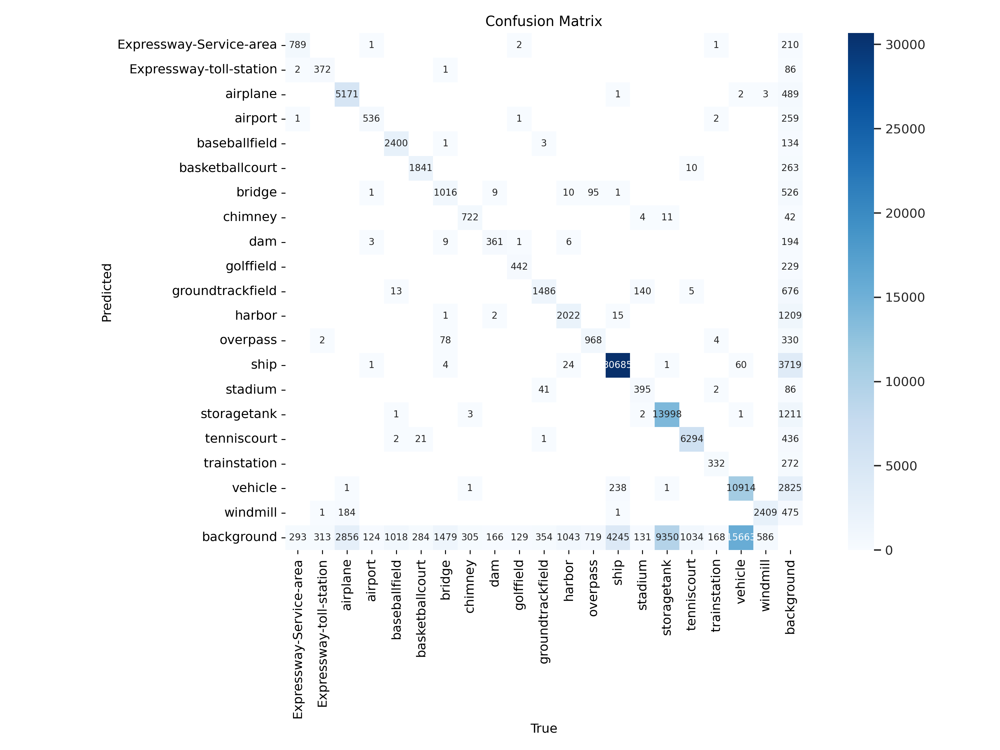

In [42]:
# Confusion Matrix
Image('runs/detect/yolov8n_val_on_test/confusion_matrix.png')

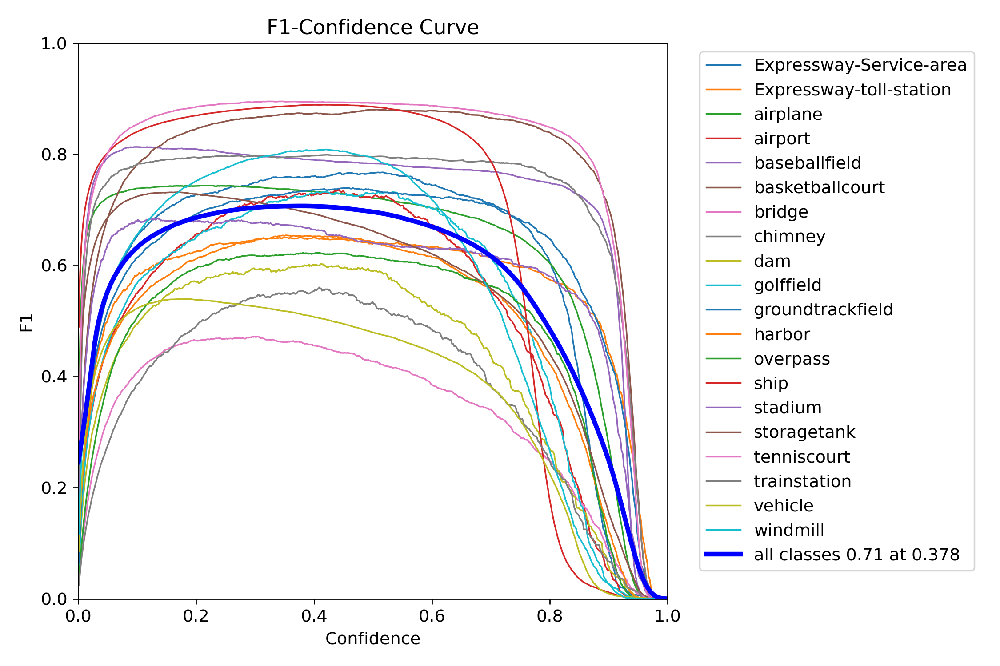

In [43]:
# F1 Curve
Image('runs/detect/yolov8n_val_on_test/F1_curve.png')

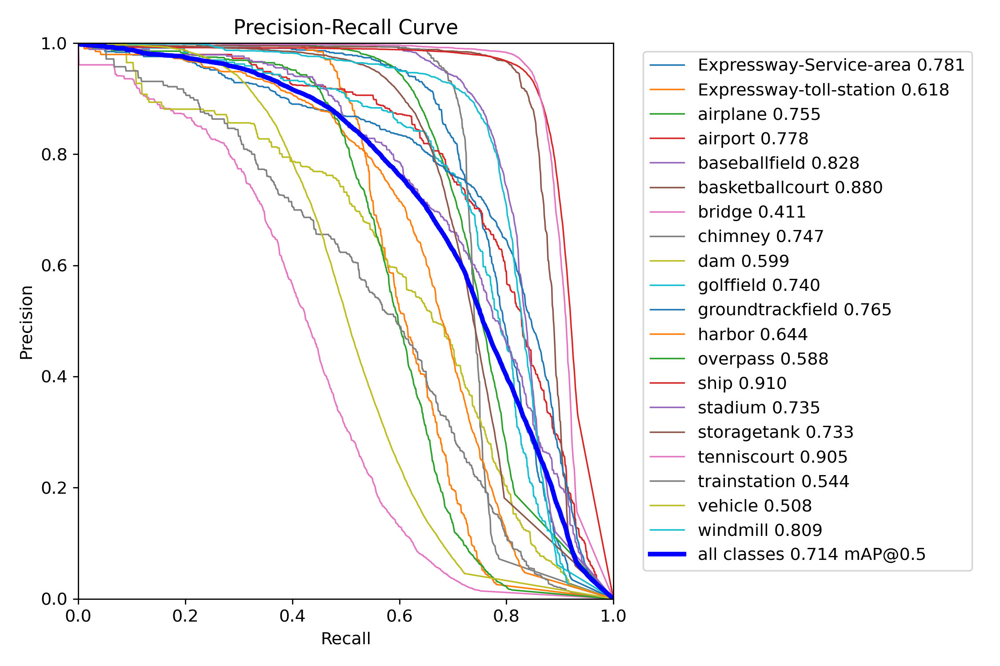

In [44]:
# PR Curve
Image('runs/detect/yolov8n_val_on_test/PR_curve.png')

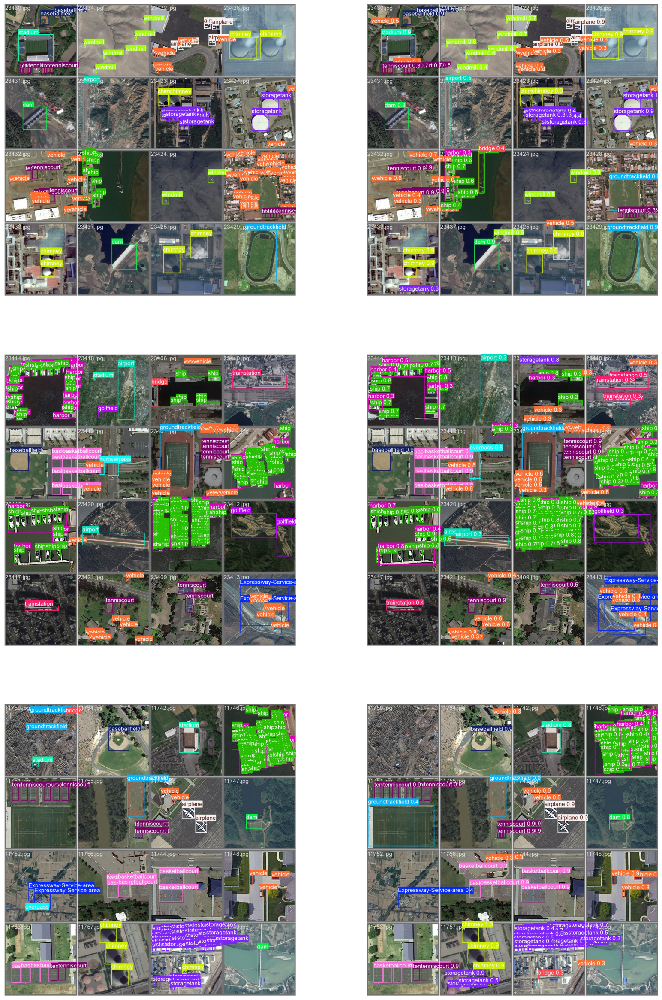

In [46]:
# Testing result[left images are True and Right images are predicted]
val_result_image = ['runs/detect/yolov8n_val_on_test/val_batch0_labels.jpg', 'runs/detect/yolov8n_val_on_test/val_batch0_pred.jpg', 'runs/detect/yolov8n_val_on_test/val_batch1_labels.jpg', 'runs/detect/yolov8n_val_on_test/val_batch1_pred.jpg', 'runs/detect/yolov8n_val_on_test/val_batch2_labels.jpg', 'runs/detect/yolov8n_val_on_test/val_batch2_pred.jpg']
plt.figure(figsize=(20, 30))
for i in range(len(val_result_image)):
    plt.subplot(3, 2, i+1)
    plt.imshow(plt.imread(val_result_image[i]))
    plt.axis(False)

## Predicting using the Yolo Model

In [47]:
# Loading the best weights
model = YOLO('runs/detect/yolov8n_epochs100_batch162/weights/best.pt')

In [50]:
def plot_bboxes(img_file: str, annot_file: str, class_dict: dict):
    """
    A function to plot the bounding boxes amd their object classes onto the image.
    
    Parameters:
        img_file: str, A string containing the path to the image file.
        annot_file: str, A string containing the path to the annotation file in yolo format.
        class_dict: dict, A dict containing the classes in the similar sequence as per the annot_file.
    """
    # Reading the image and annot file
    image = cv2.imread(img_file)
    img_h, img_w, _ = image.shape
    
    with open(annot_file, 'r') as f:
        data = f.read().split('\n')
        data = [i.split(' ') for i in data]
        data = [[float(j) for j in i] for i in data]
    
    # Calculating the bbox in Pascal VOC format
    for bbox in data:
        class_idx, x_center, y_center, width, height = bbox
        xmin = int((x_center - width / 2) * img_w)
        ymin = int((y_center - height / 2) * img_h)
        xmax = int((x_center + width / 2) * img_w)
        ymax = int((y_center + height / 2) * img_h)
        
        # Correcting bbox if out of image size
        if xmin < 0:
            xmin = 0
        if ymin < 0:
            ymin = 0
        if xmax > img_w - 1:
            xmax = img_w - 1
        if ymax > img_h - 1:
            ymax = img_h - 1
        
        # Creating the box and label for the image
        cv2.rectangle(image, (xmin, ymin), (xmax, ymax), (255, 255, 0), 2)
        cv2.putText(image, class_dict[class_idx], (xmin, 0 if ymin-10 < 0 else ymin-10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 255, 0), 2)
    
    # Displaying the image
    plt.imshow(image)
    plt.axis(False)


image 1/1 /kaggle/working/datasets/images/test/19364.jpg: 800x800 5 tenniscourts, 10.2ms
Speed: 2.5ms preprocess, 10.2ms inference, 1.7ms postprocess per image at shape (1, 3, 800, 800)
Results saved to runs/detect/predict


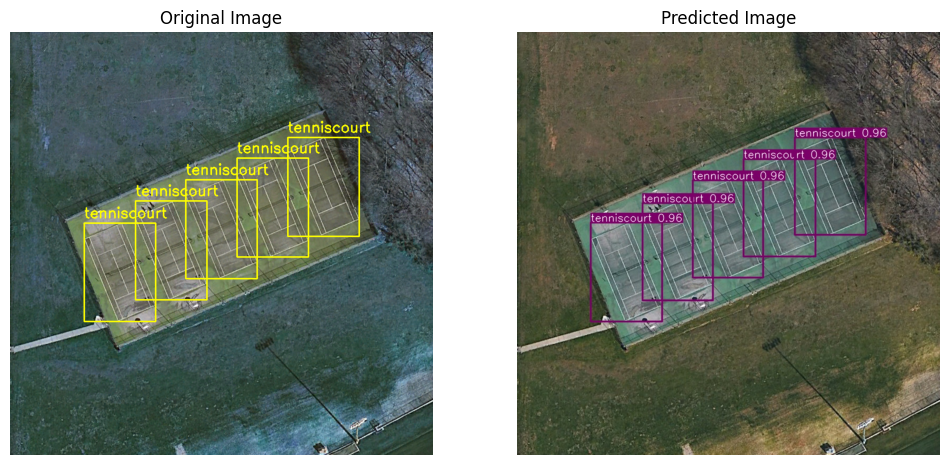

In [51]:
# Choosing a random images from the test dataset
img_test_dir = 'datasets/images/test'
label_test_dir = 'datasets/labels/test'
rand_img = random.sample(os.listdir(img_test_dir), 1)[0]
rand_img_path = os.path.join(img_test_dir, rand_img)
rand_label_path = os.path.join(label_test_dir, rand_img).replace('jpg', 'txt')

# Predicting the object using the yolo model
pred_list = model.predict(source=rand_img_path, imgsz=800, save=True, conf=0.5)
pred_img_path = os.path.join('runs/detect/predict', rand_img) # Predict path can change

# Ploting a the true and predicted images with bounding boxes
plt.figure(figsize=(12, 7))
plt.subplot(1, 2, 1)
plot_bboxes(rand_img_path, rand_label_path, class_dict_idx)
plt.title('Original Image')
plt.subplot(1, 2, 2)
plt.imshow(plt.imread(pred_img_path))
plt.title('Predicted Image')
plt.axis(False);

In [52]:
# Importing the required libraries
from ultralytics import YOLO
import squarify
import matplotlib.pyplot as plt
import cv2
import os
import random
import pandas as pd
import matplotlib.image as mpimg
import seaborn as sns

sns.set_style('darkgrid')

%matplotlib inline

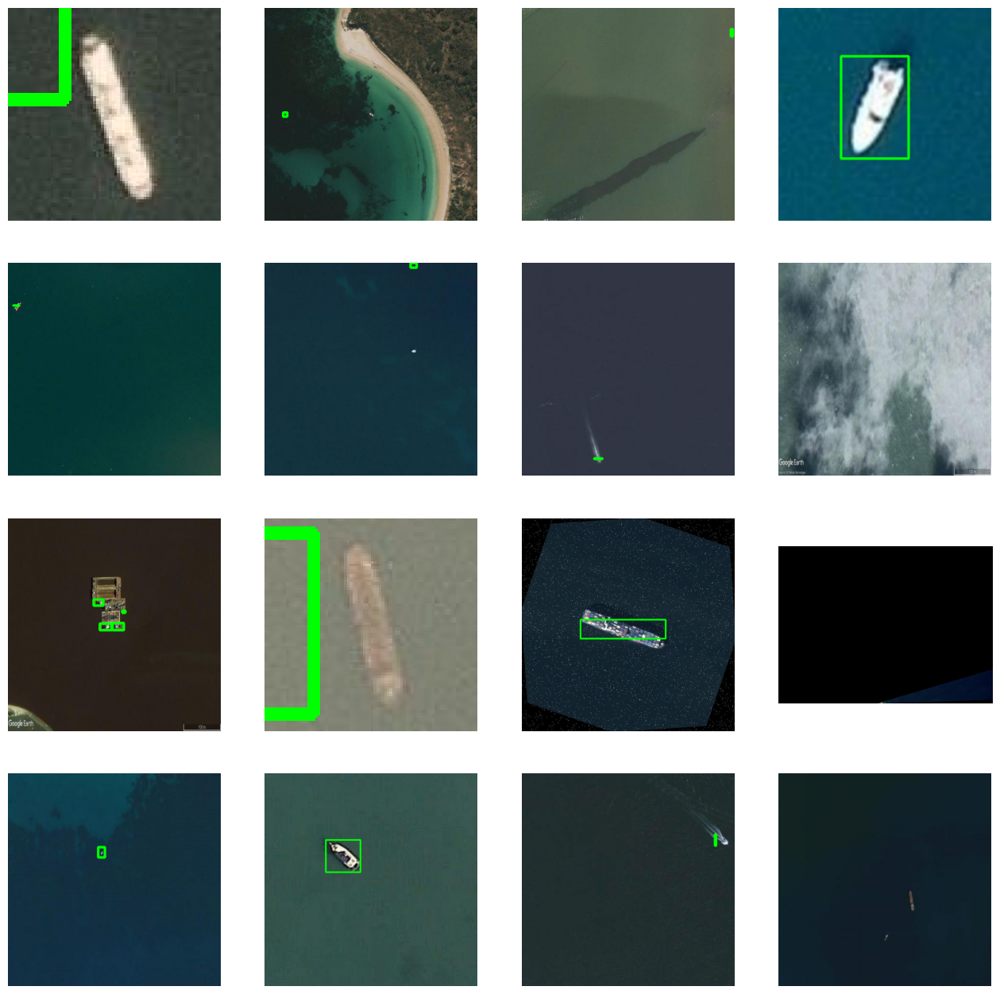

In [55]:
# Define the paths to the images and labels directories
train_images = "/kaggle/input/ships-in-aerial-images/ships-aerial-images/train/images"
train_labels = "/kaggle/input/ships-in-aerial-images/ships-aerial-images/train/labels"

test_images = "/kaggle/input/ships-in-aerial-images/ships-aerial-images/test/images"
test_labels = "/kaggle/input/ships-in-aerial-images/ships-aerial-images/test/labels"

val_images = "/kaggle/input/ships-in-aerial-images/ships-aerial-images/valid/images"
val_labels = "/kaggle/input/ships-in-aerial-images/ships-aerial-images/valid/labels"

# Get a list of all the image files in the training images directory
image_files = os.listdir(train_images)

# Choose 16 random image files from the list
random_images = random.sample(image_files, 16)

# Set up the plot
fig, axs = plt.subplots(4, 4, figsize=(16, 16))

# Loop over the random images and plot the object detections
for i, image_file in enumerate(random_images):
    row = i // 4
    col = i % 4
    
    # Load the image
    image_path = os.path.join(train_images, image_file)
    image = cv2.imread(image_path)

    # Load the labels for this image
    label_file = os.path.splitext(image_file)[0] + ".txt"
    label_path = os.path.join(train_labels, label_file)
    with open(label_path, "r") as f:
        labels = f.read().strip().split("\n")

    # Loop over the labels and plot the object detections
    # Loop over the labels and plot the object detections
    for label in labels:
        if len(label.split()) != 5:
            continue
        class_id, x_center, y_center, width, height = map(float, label.split())
        x_min = int((x_center - width/2) * image.shape[1])
        y_min = int((y_center - height/2) * image.shape[0])
        x_max = int((x_center + width/2) * image.shape[1])
        y_max = int((y_center + height/2) * image.shape[0])
        cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (0, 255, 0), 3)


    # Show the image with the object detections
    axs[row, col].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axs[row, col].axis('off')

plt.show()

In [58]:
%matplotlib inline
# Load an image using OpenCV
image = cv2.imread("/kaggle/input/ships-in-aerial-images/ships-aerial-images/test/images/02e39612d_jpg.rf.cc5483bb711f080d12b644ff62cf977a.jpg")

# Get the size of the image
height, width, channels = image.shape
print(f"The image has dimensions {width}x{height} and {channels} channels.")

The image has dimensions 768x768 and 3 channels.


In [60]:
%matplotlib inline
# Loading the best weights
model = YOLO('runs/detect/yolov8n_epochs100_batch162/weights/best.pt')

In [61]:
# Function to perform ship detections
def ship_detect(img_path):
    
    # Read the image
    img = cv2.imread(img_path)

    # Pass the image through the detection model and get the result
    detect_result = model(img)

    # Plot the detections
    detect_img = detect_result[0].plot()
    
    # Convert the image to RGB format
    detect_img = cv2.cvtColor(detect_img, cv2.COLOR_BGR2RGB)
    
    return detect_img


0: 800x800 1 harbor, 10 ships, 10.1ms
Speed: 3.4ms preprocess, 10.1ms inference, 1.5ms postprocess per image at shape (1, 3, 800, 800)

0: 800x800 (no detections), 10.1ms
Speed: 3.4ms preprocess, 10.1ms inference, 0.6ms postprocess per image at shape (1, 3, 800, 800)

0: 800x800 (no detections), 10.1ms
Speed: 3.3ms preprocess, 10.1ms inference, 0.6ms postprocess per image at shape (1, 3, 800, 800)

0: 800x800 1 ship, 10.1ms
Speed: 3.4ms preprocess, 10.1ms inference, 1.4ms postprocess per image at shape (1, 3, 800, 800)

0: 800x800 1 ship, 10.1ms
Speed: 3.3ms preprocess, 10.1ms inference, 1.4ms postprocess per image at shape (1, 3, 800, 800)

0: 800x800 1 ship, 10.1ms
Speed: 3.4ms preprocess, 10.1ms inference, 1.3ms postprocess per image at shape (1, 3, 800, 800)

0: 800x800 (no detections), 10.1ms
Speed: 3.5ms preprocess, 10.1ms inference, 0.6ms postprocess per image at shape (1, 3, 800, 800)

0: 800x800 2 dams, 10.1ms
Speed: 3.9ms preprocess, 10.1ms inference, 1.5ms postprocess per i

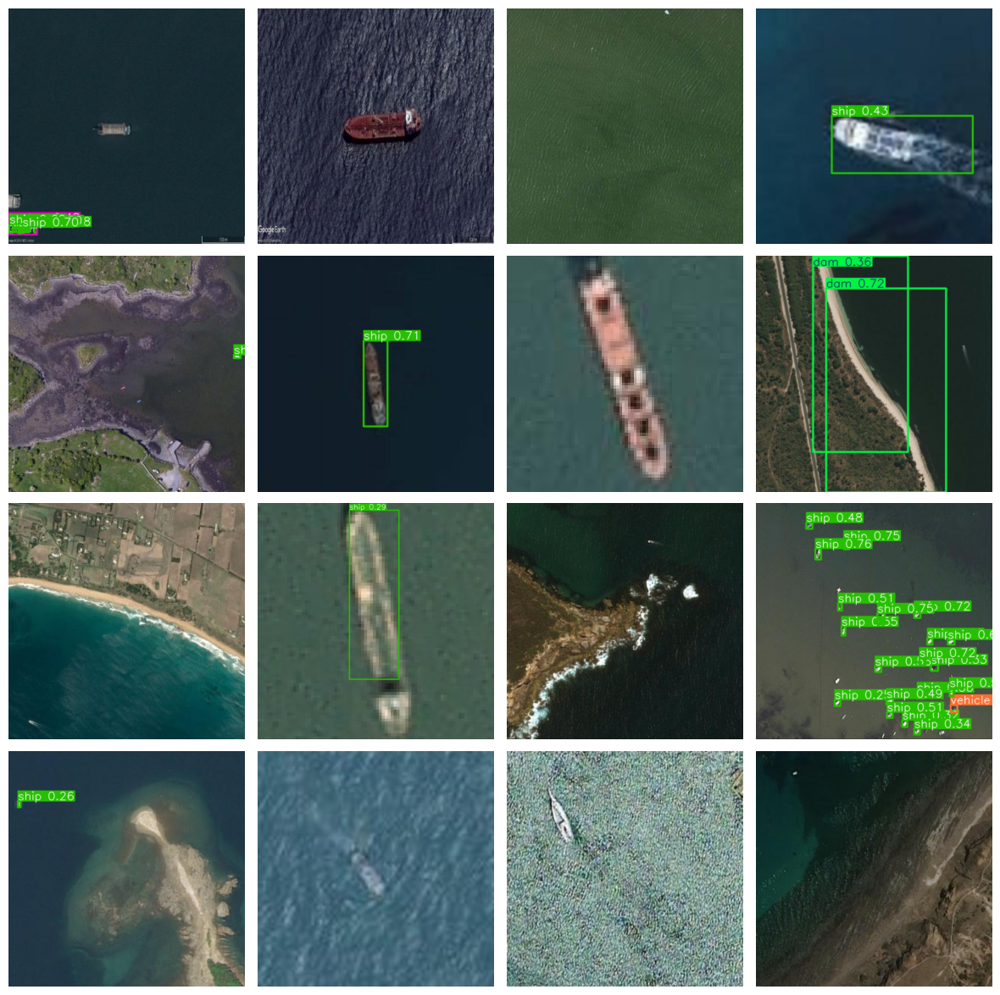

In [64]:
import random

# Define the directory where the custom images are stored
custom_image_dir = '/kaggle/input/ships-in-aerial-images/ships-aerial-images/test/images'

# Get the list of image files in the directory
image_files = os.listdir(custom_image_dir)

# Select 16 random images from the list
selected_images = random.sample(image_files, 16)

# Create a figure with subplots for each image
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(15, 15))

# Iterate over the selected images and plot each one
for i, img_file in enumerate(selected_images):
    
    # Compute the row and column index of the current subplot
    row_idx = i // 4
    col_idx = i % 4
    
    # Load the current image and run object detection
    img_path = os.path.join(custom_image_dir, img_file)
    detect_img = ship_detect(img_path)
    
    # Plot the current image on the appropriate subplot
    axes[row_idx, col_idx].imshow(detect_img)
    axes[row_idx, col_idx].axis('off')

# Adjust the spacing between the subplots
plt.subplots_adjust(wspace=0.05, hspace=0.05)
